In [1]:
#####Capstone RMBS model Spring 2021 for Springboard Data Science Track #####

In [2]:
###Load required pacakages

In [177]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import datetime
import warnings
warnings.filterwarnings('ignore')
plt.style.use('seaborn')

from fredapi import Fred
fred = Fred(api_key='deleted')
#API key removed from Github copy

import pandas_profiling
from pandas_profiling.utils.cache import cache_file

In [4]:
###Load Freddie Mac mortgage data

In [5]:
##Develop language to Unzip source files?

In [6]:
#Sample data files downloaded and stored here
#Note these files are now stored locally 
filepath = 'J:/Springboard_RMBS_model_data/FHLB/Sample/'

In [7]:
#Root file names for both origination and monthly servicing files
#National Mortgage Database Available at Freddie Mac (https://www.fhfa.gov/DataTools/Downloads/Pages/National-Mortgage-Database-Aggregate-Data.aspx)
origination_root_file ='sample_orig_'
monthly_root_file ='sample_svcg_'

In [8]:
#Initialize both dataframes
origination_data_combined =pd.DataFrame()
monthly_data_combined =pd.DataFrame()

In [9]:
#Documentation placed on Github

In [10]:
#Origination files labels from documentation -- note underscores added to help with syntax
origination_labels = ["Credit_Score",
"1st_Payment_Date",
"1st_Time_Homebuyer_Flag",
"Maturity_Date",
"MSA",
"MI%",
"Number_of_Units",
"Occupancy_Status",
"Original_CLTV",
"Original_DTI",
"Original_UPB",
"Original_LTV",
"Original_Interest_Rate",
"Channel",
"Prepayment_Penalty_Flag",
"Product_Type",
"Property_State",
"Property_Type",
"Postal_Code",
"Loan_Sequence_Number",
"Loan_Purpose",
"Original_Loan_Term",
"Number_of_Borrowers",
"Seller_Name",
"Servicer_Name",
"Super_Conforming_Flag",
"Pre-HARP_Loan_Seq_Number",
"Program_Indicator",
"HARP_Indicator",
"Property_Valuation_Method"]
#servicing_labels

In [11]:
#Monthly servicing files labels from documentation -- note underscores added to help with syntax
#columns_to_use =list(range(0,13) + range(23,25) + range(26,30))
columns_to_use =[0,1,2,3,4,5,6,7,8,9,10,11,12,23,24,26,27,28,29]
monthly_labels =["Loan_Sequence_Number",
"Monthly_Reporting_Period",
"Current_Actual_UPB",
"Current_Loan_Delinquency_Status", 
"Loan_Age",
"Remaining_Months_to_Legal_Maturity",
"Repurchase_Flag",
"Modification_Flag",
"Zero_Balance_Code",
"Zero_Balance_Effective_Date",
"Current_Interest_Rate",
"Current_Deferred_UPB",
"Due_Date_of_Last_Paid_Installment",
"Step_Modification_Flag",
"Deferred_Payment_Plan",
"Zero_Balance_Removal_UPB",
"Delinquent_Accrued_Interest",
"Delinquency_Due_to_Disaster",
"Borrower_Assistance_Status_Code"]

In [12]:
#Loops through files and appends origination data to single dataframe
for year in range(1999,2021):
    year=str(year)
    filename = filepath+origination_root_file+year+'.txt'
    data=pd.read_csv(filename,sep="|", header =None, names =origination_labels)
    origination_data_combined=origination_data_combined.append(data)

In [13]:
#Initial look at data with info()
origination_data_combined.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1075000 entries, 0 to 24999
Data columns (total 30 columns):
 #   Column                     Non-Null Count    Dtype  
---  ------                     --------------    -----  
 0   Credit_Score               1075000 non-null  int64  
 1   1st_Payment_Date           1075000 non-null  int64  
 2   1st_Time_Homebuyer_Flag    1075000 non-null  object 
 3   Maturity_Date              1075000 non-null  int64  
 4   MSA                        927414 non-null   float64
 5   MI%                        1075000 non-null  int64  
 6   Number_of_Units            1075000 non-null  int64  
 7   Occupancy_Status           1075000 non-null  object 
 8   Original_CLTV              1075000 non-null  int64  
 9   Original_DTI               1075000 non-null  int64  
 10  Original_UPB               1075000 non-null  int64  
 11  Original_LTV               1075000 non-null  int64  
 12  Original_Interest_Rate     1075000 non-null  float64
 13  Channel       

In [14]:
#Initial look at data with head()
origination_data_combined.head()

,Credit_Score,1st_Payment_Date,1st_Time_Homebuyer_Flag,Maturity_Date,MSA,MI%,Number_of_Units,Occupancy_Status,Original_CLTV,Original_DTI,...,Loan_Purpose,Original_Loan_Term,Number_of_Borrowers,Seller_Name,Servicer_Name,Super_Conforming_Flag,Pre-HARP_Loan_Seq_Number,Program_Indicator,HARP_Indicator,Property_Valuation_Method
0,799,199903,N,202901,37620.0,0,1,P,70,25,...,N,359,1,Other sellers,Other servicers,NaN,NaN,9,NaN,9
1,635,200212,N,202904,10420.0,0,1,P,76,21,...,P,317,2,Other sellers,Other servicers,NaN,NaN,9,NaN,9
2,787,199905,N,202904,12060.0,999,1,P,80,18,...,P,360,2,FT MORTGAGE COMPANIES,CHASE MANHATTAN MORTGAGE CORPORATION,NaN,NaN,9,NaN,9
3,726,199904,N,202903,28140.0,0,1,P,80,37,...,P,360,2,FLEET MORTGAGE CORPORATION,Other servicers,NaN,NaN,9,NaN,9
4,748,199905,9,202904,17140.0,999,1,P,80,28,...,N,360,2,Other sellers,Other servicers,NaN,NaN,9,NaN,9


In [15]:
#Number of missing values by column
missing = pd.concat([origination_data_combined.isnull().sum(), 100 * origination_data_combined.isnull().mean()], axis=1)
missing.columns=['count', '%']
missing.sort_values(by='count', ascending =False)

,count,%
HARP_Indicator,1074999,99.999907
Pre-HARP_Loan_Seq_Number,1074999,99.999907
Super_Conforming_Flag,1053594,98.008744
MSA,147586,13.728930
Prepayment_Penalty_Flag,4745,0.441395
Seller_Name,658,0.061209
Postal_Code,76,0.007070
Credit_Score,0,0.000000
Property_State,0,0.000000
Program_Indicator,0,0.000000


In [16]:
#Checking HARP_REALTED FLAG...
origination_data_combined = origination_data_combined[origination_data_combined['HARP_Indicator'] != 'Y']

In [17]:
#Drop HARP-RELATED columns -- not much coverage, probably not used -- in any case covered my modification flag
origination_data_combined.drop(labels=['HARP_Indicator','Pre-HARP_Loan_Seq_Number'],axis=1,inplace=True)

In [18]:
#Checking SUPER CONFORMING FLAG...
origination_data_combined['Super_Conforming_Flag'].value_counts()

Y    21406
Name: Super_Conforming_Flag, dtype: int64

In [19]:
#Checking SUPER CONFORMING FLAG...and replacing blanks with N
origination_data_combined['Super_Conforming_Flag'].fillna('N',inplace=True)

In [20]:
#Fix two columns with date types
origination_data_combined['1st_Payment_Date']=pd.to_datetime(origination_data_combined['1st_Payment_Date'],format='%Y%m', errors='coerce')
origination_data_combined['Maturity_Date']=pd.to_datetime(origination_data_combined['Maturity_Date'],format='%Y%m', errors='coerce')

In [21]:
#Replace missing MSA and assume that these are not in National
origination_data_combined['MSA'].fillna('National',inplace=True)

In [22]:
#Verify MSA fix-1
origination_data_combined['MSA'].value_counts()


National    147586
16974.0      30921
31084.0      26360
12060.0      20977
38060.0      20626
             ...  
32420.0          5
25020.0          4
41900.0          2
10380.0          2
11640.0          1
Name: MSA, Length: 437, dtype: int64

In [23]:
#Verify MSA fix-2
origination_data_combined['MSA'].isnull().sum(axis = 0)

0

In [24]:
#A reasonable number of ZIPs have no corresponding MSA -- spot checked to confirm, keep those ZIPs but...
origination_data_combined[origination_data_combined['MSA']=='National']['Postal_Code']

21       54700.0
22       44600.0
33       96900.0
42       81400.0
47       50400.0
          ...   
24955    89100.0
24961    29100.0
24969    72400.0
24976    28000.0
24990     5600.0
Name: Postal_Code, Length: 147586, dtype: float64

In [25]:
#...dropped postal (ZIP) codes, which provide too much geographic granularity
origination_data_combined.drop(labels=['Postal_Code'],axis=1,inplace=True)

In [26]:
#Vast number of loans have no PP flag, so...
origination_data_combined['Prepayment_Penalty_Flag'].value_counts()

N    1069358
Y        896
Name: Prepayment_Penalty_Flag, dtype: int64

In [27]:
#...missing prepayment fields assumed to be N
origination_data_combined['Prepayment_Penalty_Flag'].fillna('N',inplace=True)

In [28]:
#Largest originator category is the (catch-all) Other sellers, so....
origination_data_combined['Seller_Name'].value_counts()

Other sellers                        275162
WELLS FARGO BANK, N.A.               144160
WELLS FARGO HOME MORTGAGE, INC.       61501
U.S. BANK N.A.                        55884
BANK OF AMERICA, N.A.                 53644
                                      ...  
NATIONAL CITY BANK                      131
DITECH FINANCIAL LLC                    121
REGIONS BANK DBA REGIONS MORTGAGE       112
PROSPECT MORTGAGE, LLC                  108
ALLY BANK                               102
Name: Seller_Name, Length: 97, dtype: int64

In [29]:
#...so missing fields are replace with Other Sellers
origination_data_combined['Seller_Name'].fillna('Other_Sellers',inplace=True)

In [30]:
#CREDIT SCORE data looks pretty clean with 999 designating missing data - 1
pd.cut(origination_data_combined['Credit_Score'], bins =[0,500,600,700,800,900,20000]).value_counts()

(700, 800]      727533
(600, 700]      237955
(800, 900]       97533
(500, 600]        9837
(900, 20000]      1689
(0, 500]           452
Name: Credit_Score, dtype: int64

In [31]:
#CREDIT SCORE data looks pretty clean with 999 designating missing data - 2
origination_data_combined[origination_data_combined['Credit_Score']==9999]['Credit_Score']

134      9999
181      9999
372      9999
483      9999
604      9999
         ... 
42766    9999
44724    9999
27547    9999
47959    9999
23113    9999
Name: Credit_Score, Length: 1689, dtype: int64

In [32]:
#Loans without a credit score are deleted
origination_data_combined = origination_data_combined[origination_data_combined['Credit_Score'] != 9999]

In [33]:
origination_data_combined['Orig_Year']=origination_data_combined['1st_Payment_Date'].dt.year

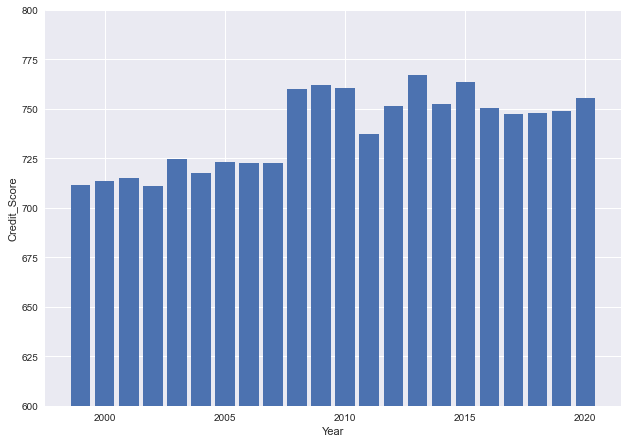

In [34]:
x1 = (origination_data_combined['Orig_Year'].unique())
y1 = (origination_data_combined.groupby('Orig_Year').Credit_Score.mean())
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(x1,y1)
ax.set_ylim(600,800)
plt.ylabel('Credit_Score')
plt.xlabel('Year')
plt.show()

(400.0, 1000.0)

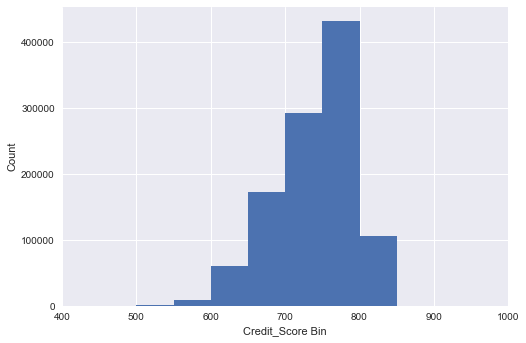

In [35]:
plt.hist(origination_data_combined['Credit_Score'], bins =[0,500,550,600,650,700,750,800,850,900,20000])
plt.ylabel('Count')
plt.xlabel('Credit_Score Bin')
plt.xlim(xmin=400, xmax = 1000)

In [36]:
#Checking MI - since only 9,125 are missing...
origination_data_combined['MI%'].value_counts().head()

0      836952
30      92596
25      81333
12      30416
999      9125
Name: MI%, dtype: int64

In [37]:
#Checking MI -- just assuming there is no MI (like most) and set to missing to 0
origination_data_combined['MI%'].replace(to_replace=999, value=0, inplace=True)

In [38]:
#Checking NUMBER OF UNITS - since only 7 are missing...
origination_data_combined['Number_of_Units'].value_counts()

1     1051298
2       16123
3        3046
4        2836
99          7
Name: Number_of_Units, dtype: int64

In [39]:
#Checking NUMBER OF UNITS ...will delete
origination_data_combined = origination_data_combined[origination_data_combined['Number_of_Units'] != 99]

In [40]:
#Checking OCCUPANCY STATUS -- looks fine
origination_data_combined['Occupancy_Status'].value_counts()

P    965228
I     63586
S     44489
Name: Occupancy_Status, dtype: int64

In [41]:
#Checking ORIGINAL CLTV
pd.cut(origination_data_combined['Original_CLTV'], bins =[0,50,60,70,75,80,90,100,110,120,130,140,200,1000]).value_counts()

(75, 80]       311372
(60, 70]       143443
(90, 100]      138339
(80, 90]       134443
(0, 50]        127019
(70, 75]       119788
(50, 60]        98474
(100, 110]        340
(200, 1000]        48
(110, 120]         25
(140, 200]          7
(120, 130]          5
(130, 140]          0
Name: Original_CLTV, dtype: int64

In [42]:
#Checking ORIGINAL CLTV -- loans with greater than 100% LTV are eliminated as typos/bad data
origination_data_combined = origination_data_combined[origination_data_combined['Original_CLTV'] <= 100]

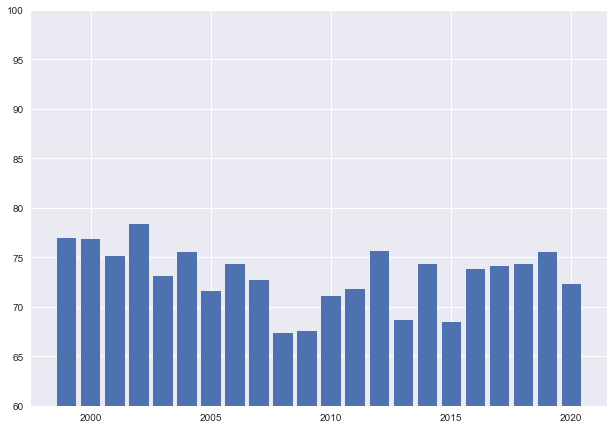

In [43]:
x1 = (origination_data_combined['Orig_Year'].unique())
y1 = (origination_data_combined.groupby('Orig_Year').Original_CLTV.mean())
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(x1,y1)
ax.set_ylim(60,100)
plt.show()

(60.0, 200.0)

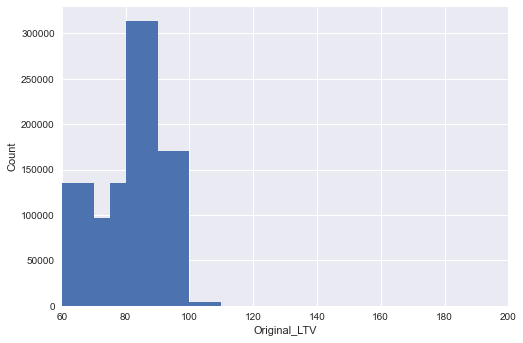

In [44]:
plt.hist(origination_data_combined['Original_LTV'], bins =[0,50,60,70,75,80,90,100,110,120,130,140,200,1000])
plt.ylabel('Count')
plt.xlabel('Original_LTV')
plt.xlim(xmin=60, xmax = 200)

In [45]:
#Checking ORIGINAL DTI 
pd.cut(origination_data_combined['Original_DTI'], bins =[0,10,20,30,40,50,55,60,65,70,75,80,100,1000]).value_counts()

(30, 40]       340934
(20, 30]       272606
(40, 50]       269738
(10, 20]       115033
(50, 55]        26303
(55, 60]        14615
(0, 10]         13724
(100, 1000]     11595
(60, 65]         8330
(80, 100]           0
(75, 80]            0
(70, 75]            0
(65, 70]            0
Name: Original_DTI, dtype: int64

In [46]:
#Checking ORIGINAL DTI -- elimininated 999 (no data)
origination_data_combined = origination_data_combined[origination_data_combined['Original_DTI'] != 999]

In [47]:
#Checking ORIGINAL UPB -- looks OK, no change
pd.cut(origination_data_combined['Original_UPB'], bins =[0,100000,200000,300000,400000,500000,700000,1000000]).value_counts()

(100000, 200000]     435244
(200000, 300000]     243133
(0, 100000]          202496
(300000, 400000]     113009
(400000, 500000]      50534
(500000, 700000]      15585
(700000, 1000000]      1272
Name: Original_UPB, dtype: int64

In [48]:
#Checking ORIGINAL LTV -- looks fine (also helped by cleaning up CLTV)
pd.cut(origination_data_combined['Original_LTV'], bins =[0,50,60,70,80,90,100,110,120,130,140,200,1000]).value_counts()

(70, 80]       460584
(60, 70]       145056
(0, 50]        131936
(90, 100]      116049
(80, 90]       106726
(50, 60]       100932
(200, 1000]         0
(140, 200]          0
(130, 140]          0
(120, 130]          0
(110, 120]          0
(100, 110]          0
Name: Original_LTV, dtype: int64

In [49]:
#Checking ORIGINAL INTEREST RATE -- looks OK, some outliers look unusual, but not change
origination_data_combined['Original_Interest_Rate'].describe()

count    1.061283e+06
mean     5.282438e+00
std      1.401034e+00
min      2.250000e+00
25%      4.125000e+00
50%      5.125000e+00
75%      6.375000e+00
max      1.149000e+01
Name: Original_Interest_Rate, dtype: float64

In [50]:
#CHANNEL -- looks fine but not change
origination_data_combined['Channel'].value_counts()

R    530557
T    251581
C    208285
B     70860
Name: Channel, dtype: int64

In [51]:
#PRODUCT TYPE -- All should be FRM...
origination_data_combined['Product_Type'].value_counts()

FRM    1061010
_          273
Name: Product_Type, dtype: int64

In [52]:
#PRODUCT TYPE ... so entire FIELD is dropped
origination_data_combined.drop(labels=['Product_Type'],axis=1,inplace=True)

In [53]:
#PROPERTY STATE looks OK but...
origination_data_combined['Property_State'].value_counts().tail()

SD    2066
WY    1852
PR    1387
GU     252
VI      38
Name: Property_State, dtype: int64

In [54]:
#PROPERTY STATE... PR, GU, VI loans eliminated
origination_data_combined = origination_data_combined[origination_data_combined['Property_State'] != ('PR','GU','VI')]

In [55]:
#PROPERTY TYPE -- looks OK...
origination_data_combined['Property_Type'].value_counts()

SF    770599
PU    207134
CO     75418
MH      5910
CP      2183
99        39
Name: Property_Type, dtype: int64

In [56]:
#PROPERTY TYPE -- ...but remove 99s
origination_data_combined = origination_data_combined[origination_data_combined['Property_Type'] != '99']

<AxesSubplot:ylabel='Property_Type'>

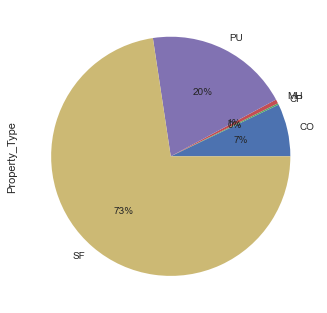

In [57]:
#PROPERTY TYPE -- looks good
origination_data_combined.Property_Type.str.get_dummies().sum().plot.pie(label='Property_Type', autopct='%1.0f%%')

In [58]:
#LOAN PURPOSE -- looks OK...
origination_data_combined['Loan_Purpose'].value_counts()

P    473646
N    311963
C    275635
Name: Loan_Purpose, dtype: int64

<AxesSubplot:ylabel='Loan_Purpose'>

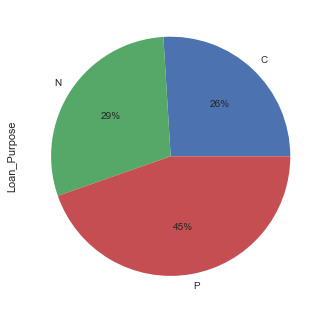

In [59]:
origination_data_combined.Loan_Purpose.str.get_dummies().sum().plot.pie(label='Loan_Purpose', autopct='%1.0f%%')

In [60]:
#ORIGINAL LOAN TERM -- looks OK...
origination_data_combined['Original_Loan_Term'].value_counts()

360    868131
180    136105
240     33607
120     10991
300      4845
        ...  
274         1
278         1
279         1
297         1
604         1
Name: Original_Loan_Term, Length: 222, dtype: int64

In [61]:
#ORIGINAL LOAN TERM ...but deleted loan terms > 400 (possible further investigation)
origination_data_combined = origination_data_combined[origination_data_combined['Original_Loan_Term'] < 400]

In [62]:
#NUMBER OF BORROWERS -- looks OK...
origination_data_combined['Number_of_Borrowers'].value_counts()

2     598629
1     462253
99       140
Name: Number_of_Borrowers, dtype: int64

In [63]:
#NUMBER OF BORROWERS -- ...delete small number of loans with na -- might be interesting variable
origination_data_combined = origination_data_combined[origination_data_combined['Number_of_Borrowers'] != 99]

In [64]:
#SERVICER NAME -- looks OK...
origination_data_combined['Servicer_Name'].value_counts()

Other servicers                          261516
WELLS FARGO BANK, N.A.                   183367
BANK OF AMERICA, N.A.                     68786
U.S. BANK N.A.                            62868
JPMORGAN CHASE BANK, N.A.                 46302
                                          ...  
U.S. BANK, N.A.                             154
PRIMELENDING A PLAINS CAPITAL CO            154
FINANCE OF AMERICA MORTGAGE LLC             141
AMTRUST BANK                                111
FIRST NATIONWIDE MORTGAGE CORPORATION       111
Name: Servicer_Name, Length: 79, dtype: int64

In [65]:
#PROGRAM INDICATOR -- looks of questionable value, with few observations...
origination_data_combined['Program_Indicator'].value_counts()

9    951666
9    103530
H      5686
Name: Program_Indicator, dtype: int64

In [66]:
#PROGRAM INDICATOR -- so field deleted
origination_data_combined.drop(labels=['Program_Indicator'],axis=1,inplace=True)

In [67]:
#PROPERTY VALUATION METHOD -- investigate later for comparing to estimated current LTVs, but limited coverage
origination_data_combined['Property_Valuation_Method'].value_counts()

9    886296
2    157932
1     15778
3       876
Name: Property_Valuation_Method, dtype: int64

In [68]:
#PROPERTY VALUATION METHOD -- but delete here
origination_data_combined.drop(labels=['Property_Valuation_Method'],axis=1,inplace=True)

In [69]:
#Convert some variables into categoricals to increases resource efficiency
convert_to_cat = ['1st_Time_Homebuyer_Flag','Number_of_Units','Occupancy_Status',
                  'Channel','Prepayment_Penalty_Flag','Property_Type','Loan_Purpose',
                 'Number_of_Borrowers','Super_Conforming_Flag']
for col in convert_to_cat:
    origination_data_combined[col]=origination_data_combined[col].astype('category') 

In [70]:
#Set index equal to LOAN SEQUENCE NUMBER
origination_data_combined.set_index('Loan_Sequence_Number', inplace=True)

In [71]:
#Final data frame

In [72]:
#Sample of final data frame -- initial very small for development -- will increase for model
origination_data_combined=origination_data_combined.sample(frac=.00001, replace=False, weights=None, random_state=1234, axis=0)

In [73]:
#Re-check sample
origination_data_combined.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11 entries, F106Q3216088 to F106Q3238466
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Credit_Score             11 non-null     int64         
 1   1st_Payment_Date         11 non-null     datetime64[ns]
 2   1st_Time_Homebuyer_Flag  11 non-null     category      
 3   Maturity_Date            11 non-null     datetime64[ns]
 4   MSA                      11 non-null     object        
 5   MI%                      11 non-null     int64         
 6   Number_of_Units          11 non-null     category      
 7   Occupancy_Status         11 non-null     category      
 8   Original_CLTV            11 non-null     int64         
 9   Original_DTI             11 non-null     int64         
 10  Original_UPB             11 non-null     int64         
 11  Original_LTV             11 non-null     int64         
 12  Original_Interest_Rate

In [74]:
#Re-check sample -- number of missing values by column
missing = pd.concat([origination_data_combined.isnull().sum(), 100 * origination_data_combined.isnull().mean()], axis=1)
missing.columns=['count', '%']
missing.sort_values(by='count', ascending =False)

,count,%
Credit_Score,0,0.0
1st_Payment_Date,0,0.0
Super_Conforming_Flag,0,0.0
Servicer_Name,0,0.0
Seller_Name,0,0.0
Number_of_Borrowers,0,0.0
Original_Loan_Term,0,0.0
Loan_Purpose,0,0.0
Property_Type,0,0.0
Property_State,0,0.0


In [75]:
#Re-check sample
origination_data_combined.head()

,Credit_Score,1st_Payment_Date,1st_Time_Homebuyer_Flag,Maturity_Date,MSA,MI%,Number_of_Units,Occupancy_Status,Original_CLTV,Original_DTI,...,Prepayment_Penalty_Flag,Property_State,Property_Type,Loan_Purpose,Original_Loan_Term,Number_of_Borrowers,Seller_Name,Servicer_Name,Super_Conforming_Flag,Orig_Year
Loan_Sequence_Number,,,,,,,,,,,,,,,,,,,,,
F106Q3216088,792,2006-11-01,N,2036-10-01,National,0,2,I,80,13,...,N,OH,SF,P,360,1,"CITIMORTGAGE, INC.",Other servicers,N,2006
F107Q2221388,721,2007-08-01,N,2037-07-01,19740,25,1,P,90,65,...,N,CO,PU,P,360,2,"TAYLOR, BEAN & WHITAKER MORTGAGE CORP.","TAYLOR, BEAN & WHITAKER MORTGAGE CORP.",N,2007
F116Q2351471,704,2016-08-01,N,2046-07-01,47664,30,1,P,95,41,...,N,MI,CO,P,360,2,Other sellers,Other servicers,N,2016
F113Q1278888,806,2013-03-01,9,2028-02-01,47894,0,1,P,45,27,...,N,DC,SF,N,180,1,"WELLS FARGO BANK, N.A.","WELLS FARGO BANK, N.A.",N,2013
F112Q2085695,757,2012-07-01,9,2042-06-01,41180,0,1,P,93,14,...,N,MO,SF,N,360,2,BRANCH BANKING & TRUST COMPANY,BRANCH BANKING & TRUST COMPANY,N,2012


In [76]:
#Re-check sample
origination_data_combined.shape

(11, 24)

In [77]:
#### Performance data section

In [78]:
#Loops through files and appends monthly performance data to single dataframe
for year in range(1999,2021):
    year=str(year)
    filename = filepath+monthly_root_file+year+'.txt'
    data=pd.read_csv(filename,sep="|", header =None, names= monthly_labels,usecols =columns_to_use)
    monthly_data_combined=monthly_data_combined.append(data)

In [79]:
#Quick initial look
monthly_data_combined.head()

,Loan_Sequence_Number,Monthly_Reporting_Period,Current_Actual_UPB,Current_Loan_Delinquency_Status,Loan_Age,Remaining_Months_to_Legal_Maturity,Repurchase_Flag,Modification_Flag,Zero_Balance_Code,Zero_Balance_Effective_Date,Current_Interest_Rate,Current_Deferred_UPB,Due_Date_of_Last_Paid_Installment,Step_Modification_Flag,Deferred_Payment_Plan,Zero_Balance_Removal_UPB,Delinquent_Accrued_Interest,Delinquency_Due_to_Disaster,Borrower_Assistance_Status_Code
0,F199Q1000012,200208,42058.58,0,42,317,NaN,NaN,NaN,NaN,6.875,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,F199Q1000012,200209,42011.81,0,43,316,NaN,NaN,NaN,NaN,6.875,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,F199Q1000012,200210,41964.77,0,44,315,NaN,NaN,NaN,NaN,6.875,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,F199Q1000012,200211,41917.46,0,45,314,NaN,NaN,NaN,NaN,6.875,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,F199Q1000012,200212,41869.88,0,46,313,NaN,NaN,NaN,NaN,6.875,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [80]:
#Convert some variables into categoricals to increases resource efficiency
convert_to_cat = ['Current_Loan_Delinquency_Status','Repurchase_Flag','Modification_Flag',
                  'Zero_Balance_Code','Step_Modification_Flag','Deferred_Payment_Plan', 
                  'Delinquency_Due_to_Disaster','Borrower_Assistance_Status_Code']
for col in convert_to_cat:
    monthly_data_combined[col]=monthly_data_combined[col].astype('category')

In [81]:
#Quick initial look
monthly_data_combined.shape

(53626855, 19)

In [82]:
#Quick initial look
monthly_data_combined.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53626855 entries, 0 to 132145
Data columns (total 19 columns):
 #   Column                              Dtype   
---  ------                              -----   
 0   Loan_Sequence_Number                object  
 1   Monthly_Reporting_Period            int64   
 2   Current_Actual_UPB                  float64 
 3   Current_Loan_Delinquency_Status     category
 4   Loan_Age                            int64   
 5   Remaining_Months_to_Legal_Maturity  int64   
 6   Repurchase_Flag                     category
 7   Modification_Flag                   category
 8   Zero_Balance_Code                   category
 9   Zero_Balance_Effective_Date         float64 
 10  Current_Interest_Rate               float64 
 11  Current_Deferred_UPB                float64 
 12  Due_Date_of_Last_Paid_Installment   float64 
 13  Step_Modification_Flag              category
 14  Deferred_Payment_Plan               category
 15  Zero_Balance_Removal_UPB        

In [83]:
###Number Of Missing Values By Column
missing = pd.concat([monthly_data_combined.isnull().sum(), 100 * monthly_data_combined.isnull().mean()], axis=1)
missing.columns=['count', '%']
missing.sort_values(by='count', ascending =False)

,count,%
Deferred_Payment_Plan,53623715,99.994145
Modification_Flag,53609136,99.966959
Step_Modification_Flag,53609121,99.966931
Delinquent_Accrued_Interest,53601681,99.953057
Delinquency_Due_to_Disaster,53540914,99.839743
Borrower_Assistance_Status_Code,53503691,99.770331
Due_Date_of_Last_Paid_Installment,53489368,99.743623
Zero_Balance_Code,52839498,98.531786
Zero_Balance_Effective_Date,52839498,98.531786
Zero_Balance_Removal_UPB,52839497,98.531784


In [84]:
#Set index equal to LOAN SEQUENCE NUMBER
monthly_data_combined.set_index('Loan_Sequence_Number', inplace=True)

In [85]:
#May integrate 11 field with multiple 98% NULLs later as part of impact of mods -- for now focus on 8 remaining fields

In [86]:
#MONTHLY REPORTING PERIOD -- looks OK...
monthly_data_combined['Monthly_Reporting_Period'].max()

202009

In [87]:
#CURRENT INTEREST RATE has a small number of outliers...
monthly_data_combined['Current_Interest_Rate'].loc[monthly_data_combined['Current_Interest_Rate'] > 15].value_counts()

20.00    22
51.25     7
21.25     2
47.50     2
37.50     2
50.00     1
Name: Current_Interest_Rate, dtype: int64

In [88]:
#CURRENT INTEREST RATE ...so deleted those 
monthly_data_combined = monthly_data_combined[monthly_data_combined['Current_Interest_Rate'] < 15]

In [89]:
#CURRENT DEFERRED UPB -- looks good, with small amounts as expected...
monthly_data_combined['Current_Deferred_UPB'].describe()

count    5.362682e+07
mean     1.625727e+02
std      3.672849e+03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      3.957869e+05
Name: Current_Deferred_UPB, dtype: float64

In [90]:
#CURRENT DEFERRED UPB...so keep
monthly_data_combined['Current_Deferred_UPB'].value_counts()

0.00        53421689
19700.00         515
7100.00          512
4200.00          481
35600.00         474
              ...   
16127.23           1
14775.48           1
4683.48            1
13946.52           1
6576.08            1
Name: Current_Deferred_UPB, Length: 6464, dtype: int64

In [91]:
#REMAINING MONTHS TO LEGAL MATURITY -- a few loans longer than 40 years, but this variable likely not important -- DELETE LATER?
monthly_data_combined['Remaining_Months_to_Legal_Maturity'].loc[monthly_data_combined['Remaining_Months_to_Legal_Maturity'] > 485].value_counts()

486    14
487    14
488    14
489    14
490    14
       ..
599     2
601     1
602     1
600     1
603     1
Name: Remaining_Months_to_Legal_Maturity, Length: 118, dtype: int64

In [92]:
#LOAN AGE -- looks fine
monthly_data_combined['Loan_Age'].value_counts()

2      1038881
3      1036430
4      1030239
5      1021508
1      1020045
        ...   
255        318
256        247
257        179
258        114
259         64
Name: Loan_Age, Length: 260, dtype: int64

In [93]:
#CURRENT LOAN DELINQUENCY STATUS -- looks fine but may bucket
monthly_data_combined['Current_Loan_Delinquency_Status'].value_counts()

0     35502326
0     16377550
1       687732
2       215027
3        99312
        ...   
73           1
74           1
75           1
77           1
96           1
Name: Current_Loan_Delinquency_Status, Length: 270, dtype: int64

In [94]:
#CURRENT ACTUAL UPB -- looks fine...
monthly_data_combined['Current_Actual_UPB'].value_counts()

0.00         787568
100000.00     68181
199000.00     49092
99000.00      44211
150000.00     43923
              ...  
54901.60          1
246966.12         1
246967.87         1
54922.40          1
257076.60         1
Name: Current_Actual_UPB, Length: 20947125, dtype: int64

In [95]:
#CURRENT ACTUAL UPB...but may look at some of the high values
pd.cut(monthly_data_combined['Current_Actual_UPB'], bins =[0,100000,200000,300000,400000,500000,600000,700000,800000]).value_counts()

(100000, 200000]    21530381
(0, 100000]         15599573
(200000, 300000]     9920221
(300000, 400000]     4260186
(400000, 500000]     1107622
(500000, 600000]      310215
(600000, 700000]       90234
(700000, 800000]       18253
Name: Current_Actual_UPB, dtype: int64

In [96]:
#Fix MONTHLY REPORTING PERIOD date so all conform to same format
monthly_data_combined['Monthly_Reporting_Period']=pd.to_datetime(monthly_data_combined['Monthly_Reporting_Period'],format='%Y%m', errors='coerce')
monthly_data_combined['Zero_Balance_Effective_Date']=pd.to_datetime(monthly_data_combined['Zero_Balance_Effective_Date'],format='%Y%m', errors='coerce')
monthly_data_combined['Due_Date_of_Last_Paid_Installment']=pd.to_datetime(monthly_data_combined['Due_Date_of_Last_Paid_Installment'],format='%Y%m', errors='coerce')

In [97]:
#Assigning label to x-axis 
monthly_data_combined = pd.DataFrame(monthly_data_combined).rename_axis('Monthly_Attribute', axis=1)

In [98]:
#Quick look at delinquency information
monthly_data_pivot = monthly_data_combined.pivot(columns='Monthly_Reporting_Period',values='Current_Loan_Delinquency_Status')

In [99]:
monthly_data_pivot

Monthly_Reporting_Period,1999-02-01,1999-03-01,1999-04-01,1999-05-01,1999-06-01,1999-07-01,1999-08-01,1999-09-01,1999-10-01,1999-11-01,...,2019-12-01,2020-01-01,2020-02-01,2020-03-01,2020-04-01,2020-05-01,2020-06-01,2020-07-01,2020-08-01,2020-09-01
Loan_Sequence_Number,,,,,,,,,,,,,,,,,,,,,
F100Q1000004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
F100Q1000012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
F100Q1000016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
F100Q1000024,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
F100Q1000033,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F199Q4169400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
F199Q4169405,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
F199Q4169445,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [100]:
#Initialize data from using origination sample loans only
monthly_data_combined_orig_sample_only =pd.DataFrame(index=origination_data_combined.index.values)
monthly_data_combined_orig_sample_only.rename_axis("Loan_Sequence_Number", inplace=True)

In [101]:
#Assigning label to x-axis and y-axis
monthly_data_combined_orig_sample_only=monthly_data_combined_orig_sample_only.join(monthly_data_combined, on='Loan_Sequence_Number', how='left')
monthly_data_combined_orig_sample_only = pd.DataFrame(monthly_data_combined_orig_sample_only).rename_axis('Monthly_Attribute', axis=1)

In [ ]:
##Data from FRED
# S&P/Case-Shiller 20-City Composite Home Price (SA): SPCS20RSA
# S&P/Case-Shiller U.S. National Home Price Index (SA): CSUSHPISA
# Unemployment Rate (SA):UNRATENSA
# Labor Force Participation Rate:CIVPART
# 10-Year Treasury Constant Maturity Rate: DGS10
# 30-Year Fixed Rate Mortgage Average in the United States: MORTGAGE30US

In [ ]:
#fred.search('shiller')

In [103]:
#Look at graphs quickly -- all check out
quick_look=fred.get_series('SPCS20RSA')

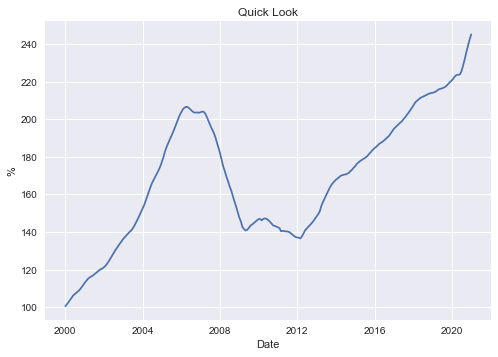

In [104]:
plt.plot(quick_look)
plt.title('Quick Look')
plt.ylabel('%')
plt.xlabel('Date')
plt.show()

In [105]:
#Pull the indixes -- note that the last two needed further work on dates before transposing
CS_HPA_20_cities= pd.DataFrame(fred.get_series('SPCS20RSA')).T
CS_HP =pd.DataFrame(fred.get_series('CSUSHPISA')).T
UNEMPLOY = pd.DataFrame(fred.get_series('UNRATENSA')).T
LF_Part = pd.DataFrame(fred.get_series('CIVPART')).T
Y10_CMT = pd.DataFrame(fred.get_series('DGS10'))
Y30_fixed_mortgage_rate=pd.DataFrame(fred.get_series('MORTGAGE30US'))

In [106]:
##This section to fix Y10_CMT date -- there must be a better way! *******

In [107]:
Y10_CMT = Y10_CMT.resample('M').mean().fillna(0)

In [108]:
Y10_CMT['new_year'] =Y10_CMT.index.year 
Y10_CMT['new_month'] =Y10_CMT.index.month
Y10_CMT['new_day']=1

In [109]:
cols = ['new_year', 'new_month', 'new_day']
Y10_CMT['new_date'] = Y10_CMT[cols].apply(lambda row: '-'.join(row.values.astype(str)), axis=1)

In [110]:
Y10_CMT['new_date'] =pd.to_datetime(Y10_CMT['new_date'])

In [111]:
Y10_CMT['new_date']

1962-01-31   1962-01-01
1962-02-28   1962-02-01
1962-03-31   1962-03-01
1962-04-30   1962-04-01
1962-05-31   1962-05-01
                ...    
2020-12-31   2020-12-01
2021-01-31   2021-01-01
2021-02-28   2021-02-01
2021-03-31   2021-03-01
2021-04-30   2021-04-01
Freq: M, Name: new_date, Length: 712, dtype: datetime64[ns]

In [112]:
Y10_CMT.set_index('new_date',inplace=True)

In [113]:
Y10_CMT=Y10_CMT[0]

In [114]:
Y10_CMT

new_date
1962-01-01    4.083182
1962-02-01    4.039444
1962-03-01    3.930455
1962-04-01    3.843000
1962-05-01    3.873636
                ...   
2020-12-01    0.933636
2021-01-01    1.081053
2021-02-01    1.257895
2021-03-01    1.610870
2021-04-01    1.690000
Name: 0, Length: 712, dtype: float64

In [115]:
Y10_CMT=Y10_CMT.T

In [116]:
#This section to fix Y30_fixed_mortgage_rate date -- there must be a better way! *******

In [117]:
Y30_fixed_mortgage_rate = Y30_fixed_mortgage_rate.resample('M').mean().fillna(0)

In [118]:
Y30_fixed_mortgage_rate['new_year'] =Y30_fixed_mortgage_rate.index.year 
Y30_fixed_mortgage_rate['new_month'] =Y30_fixed_mortgage_rate.index.month
Y30_fixed_mortgage_rate['new_day']=1

In [119]:
cols = ['new_year', 'new_month', 'new_day']
Y30_fixed_mortgage_rate['new_date'] = Y30_fixed_mortgage_rate[cols].apply(lambda row: '-'.join(row.values.astype(str)), axis=1)

In [120]:
Y30_fixed_mortgage_rate['new_date'] =pd.to_datetime(Y30_fixed_mortgage_rate['new_date'])

In [121]:
Y30_fixed_mortgage_rate['new_date']

1971-04-30   1971-04-01
1971-05-31   1971-05-01
1971-06-30   1971-06-01
1971-07-31   1971-07-01
1971-08-31   1971-08-01
                ...    
2020-12-31   2020-12-01
2021-01-31   2021-01-01
2021-02-28   2021-02-01
2021-03-31   2021-03-01
2021-04-30   2021-04-01
Freq: M, Name: new_date, Length: 601, dtype: datetime64[ns]

In [122]:
Y30_fixed_mortgage_rate.set_index('new_date',inplace=True)

In [123]:
Y30_fixed_mortgage_rate=Y30_fixed_mortgage_rate[0]

In [124]:
Y30_fixed_mortgage_rate

new_date
1971-04-01    7.3100
1971-05-01    7.4250
1971-06-01    7.5300
1971-07-01    7.6040
1971-08-01    7.6975
               ...  
2020-12-01    2.6840
2021-01-01    2.7350
2021-02-01    2.8100
2021-03-01    3.0825
2021-04-01    3.1800
Name: 0, Length: 601, dtype: float64

In [125]:
Y30_fixed_mortgage_rate=Y30_fixed_mortgage_rate.T

In [126]:
##End of the date fixes

In [145]:
#Preparing to constructing data frame for macro data
macro_index_list =[CS_HPA_20_cities,CS_HP,UNEMPLOY,LF_Part,Y10_CMT,Y30_fixed_mortgage_rate]
macro_index_labels =['CS_HPA_20_cities','CS_HP','CS_HP,UNEMPLOY','LF_Part','Y10_CMT','Y30_fixed_mortgage_rate']

In [157]:
#Creating data frame for macro values using dates from monthly performance data frame
macro_data =pd.DataFrame(columns=monthly_data_pivot.columns.values)
macro_data=macro_data.fillna(0)

In [158]:
#Appending all the indices to data frame - Note cannot include all appends in single ccell
macro_data = macro_data.append(CS_HPA_20_cities)

In [159]:
macro_data = macro_data.append(CS_HP)

In [160]:
macro_data = macro_data.append(UNEMPLOY)

In [161]:
macro_data = macro_data.append(LF_Part)

In [162]:
macro_data = macro_data.append(Y10_CMT)

In [163]:
macro_data = macro_data.append(Y30_fixed_mortgage_rate)

In [164]:
#Adding index labels to data frame
macro_data.index=macro_index_labels

In [165]:
#Deleting unneccessary history
macro_data=macro_data.loc[:,"1999-1-01":"2020-12-01"]

In [166]:
#Changing index labels to facilitate joining
macro_data = macro_data.rename_axis('Macro_Index').rename_axis("Monthly_Reporting_Period", axis="columns")

In [167]:
#For development purposes, saving locally to inspect
#origination_data_combined.to_csv('C:/Users/Jonathan/Desktop/Springboard_Course/Save to folder/static_loan_data.csv')

In [168]:
#For development purposes, saving locally to inspect
#monthly_data_combined_orig_sample_only.to_csv('C:/Users/Jonathan/Desktop/Springboard_Course/Save to folder/monthly_loan_performance_data.csv')

In [169]:
#For development purposes, saving locally to inspect
#macro_data.to_csv('C:/Users/Jonathan/Desktop/Springboard_Course/Save to folder/monthly_macroeconomic_data.csv')

In [170]:
#Transpose to join to monthly file
macro_data=macro_data.T

In [171]:
#Join monthly loan file to macro file
monthly_loan_macro_combined=monthly_data_combined_orig_sample_only.join(macro_data, on='Monthly_Reporting_Period', how='left')

In [172]:
#For development purposes, saving locally to inspect
#monthly_loan_macro_combined.to_csv('C:/Users/Jonathan/Desktop/Springboard_Course/Save to folder/first_join.csv')

In [173]:
#Final join 
all_data_combined = monthly_loan_macro_combined.join(origination_data_combined, on='Loan_Sequence_Number', how='left')

In [174]:
all_data_combined.head()

,Monthly_Reporting_Period,Current_Actual_UPB,Current_Loan_Delinquency_Status,Loan_Age,Remaining_Months_to_Legal_Maturity,Repurchase_Flag,Modification_Flag,Zero_Balance_Code,Zero_Balance_Effective_Date,Current_Interest_Rate,...,Prepayment_Penalty_Flag,Property_State,Property_Type,Loan_Purpose,Original_Loan_Term,Number_of_Borrowers,Seller_Name,Servicer_Name,Super_Conforming_Flag,Orig_Year
Loan_Sequence_Number,,,,,,,,,,,,,,,,,,,,,
F106Q3216088,2006-10-01,86000.0,0,0,360,NaN,NaN,NaN,NaT,6.75,...,N,OH,SF,P,360,1,"CITIMORTGAGE, INC.",Other servicers,N,2006
F106Q3216088,2006-11-01,86000.0,0,1,359,NaN,NaN,NaN,NaT,6.75,...,N,OH,SF,P,360,1,"CITIMORTGAGE, INC.",Other servicers,N,2006
F106Q3216088,2006-12-01,86000.0,0,2,358,NaN,NaN,NaN,NaT,6.75,...,N,OH,SF,P,360,1,"CITIMORTGAGE, INC.",Other servicers,N,2006
F106Q3216088,2007-01-01,85000.0,0,3,357,NaN,NaN,NaN,NaT,6.75,...,N,OH,SF,P,360,1,"CITIMORTGAGE, INC.",Other servicers,N,2006
F106Q3216088,2007-02-01,85000.0,0,4,356,NaN,NaN,NaN,NaT,6.75,...,N,OH,SF,P,360,1,"CITIMORTGAGE, INC.",Other servicers,N,2006


In [176]:
#For development purposes, saving locally to inspect
all_data_combined.to_csv('C:/Users/Jonathan/Desktop/Springboard_Course/Save to folder/final_data_frame_sample.csv')

In [178]:
df=all_data_combined

In [182]:
## Future tasks
# Integrate loss data
# Create one performance field
# Make sure that flags carry forward into future
# Function to adjust LTVs for HPI

In [ ]:
##Pandas profiling for use with final data frame

In [179]:
report = df.profile_report(sort='None', html={'style':{'full_width': True}}, progress_bar=False)
report

In [181]:
profile_report = df.profile_report(html={'style': {'full_width': True}})
profile_report.to_file("C:/Users/Jonathan/Desktop/Springboard_Course/Save to folder/example.html")